In [71]:
import scipy
import scipy.ndimage
import numpy as np
import matplotlib.pyplot as plt
import imageio
from urllib.request import urlopen
from PIL import Image
import os
from mpl_toolkits.mplot3d import Axes3D
from astropy.utils.data import get_pkg_data_filename
from astropy.io import fits

# Работа с изображениями
Python имеет огромный простор для работы с изображениями, и у него есть ну просто вагон всяких библиотек ([PIL](https://pillow.readthedocs.io/en/stable/), [imageio](https://pypi.org/project/imageio/), [ndimage](https://docs.scipy.org/doc/scipy/reference/ndimage.html), [scikit-image](https://scikit-image.org/)), которые могут делать почти все: манипуляциии с каналами изображения, сглаживание (так называемый гауссиан блюр широко известный в узких кругах любителей фотошеппа), подтягивание контраста и даже выделение границ объектов на изображении. Но нас в основном интересует работа с изображением как с массивом чиселок. Давайте немного поиграемся:

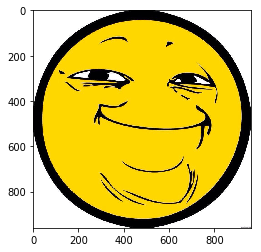

In [12]:
allo = imageio.imread('data/PmYZEQL.jpg')

plt.imshow(allo)
plt.show()

Собственно, изображение представляет из себя **обычные np.array** по трем `r g b` каналам совмещенные на одном изображении. Давайте попробуем построить что нибудь из каналов отдельно:

Размеры массива:  (960, 960, 3)


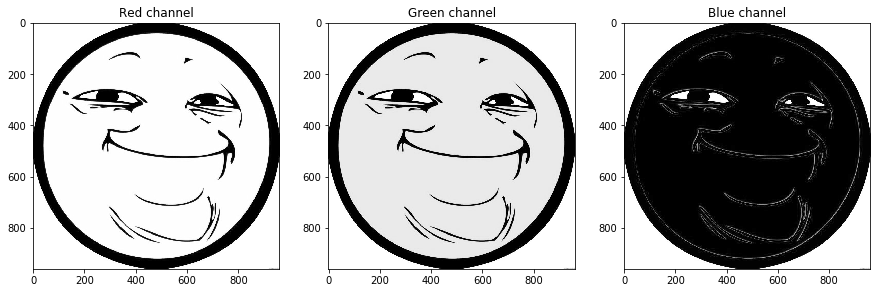

In [13]:
print('Размеры массива: ', allo.shape) # посмотрите как выглдяит структура: три массива 960х960 пикселей
f, ax = plt.subplots(1, 3, figsize=(15,15)) # именно так можно рисовать несколько графиков рядом
ax[0].imshow(allo[:,:,0], cmap='Greys_r')
ax[0].set_title('Red channel')
ax[1].imshow(allo[:,:,1], cmap='Greys_r')
ax[1].set_title('Green channel')
ax[2].imshow(allo[:,:,2], cmap='Greys_r')
ax[2].set_title('Blue channel')
plt.show()

Важно то, что это самые обычные чиселки от 0 до 255 типа [`uint8`](https://docs.scipy.org/doc/numpy/user/basics.types.html) в трех массивах того же размера что и ваше изображения. А значит, вы можете делать с ними все те вещи которые вы можете делать с массивами: перемножать, менять, обрезать, индексировать хитрым образом, ну вот буквально все, что вам придет в голову. Давайте ради фана обрежем что нибудь:

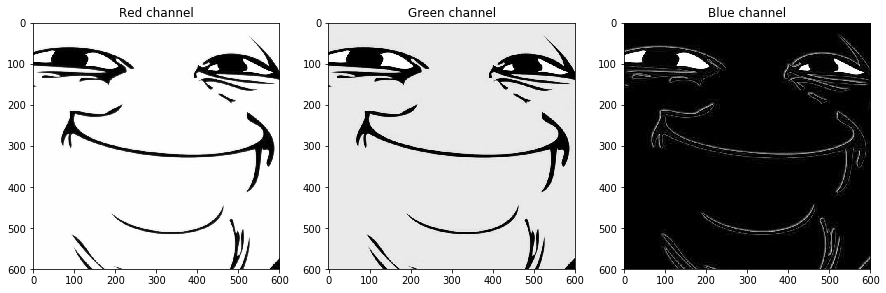

In [4]:
f, ax = plt.subplots(1, 3, figsize=(15,15))
ax[0].imshow(allo[200:800,200:800,0], cmap='Greys_r')
ax[0].set_title('Red channel')
ax[1].imshow(allo[200:800,200:800,1], cmap='Greys_r')
ax[1].set_title('Green channel')
ax[2].imshow(allo[200:800,200:800,2], cmap='Greys_r')
ax[2].set_title('Blue channel')
plt.show()

## Astropy
Что это такое и зачем? Это пакет для работы с астрономическими данными. Мы его будем использовать для считывания `FITS` данных, но вообще это [прикольный инструмент](http://docs.astropy.org/en/stable/index.html). Кстати, вам его возможно придется накатить в конду. Вам нужно будет открыть `anaconda prompt` и вбить туда `conda update astropy` или `conda install -c anaconda astropy`, что-то из этого должно сработать.

Так как у меня нет под рукой каких неибудь красивых фоточек с телескопов (есть только некрасивые), то нагло заюзаем пример из документации:

In [5]:
image_file = get_pkg_data_filename('tutorials/FITS-images/HorseHead.fits')
horse = fits.open(image_file)

Давайте выйдем за рамочки <s>набора супного</s> туториала и посмотрим, а чо у нас там лежит в данных:

In [6]:
horse.info()

Filename: /home/teimy/.astropy/cache/download/py3/2c9202ae878ecfcb60878ceb63837f5f
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     161   (891, 893)   int16   
  1  er.mask       1 TableHDU        25   1600R x 4C   [F6.2, F6.2, F6.2, F6.2]   


Ничо не понятно. Давайте посмотрим поближе. Синтаксис немного странный, но можно привыкнуть:

In [7]:
horse[0].header

SIMPLE  =                    T /FITS: Compliance                                
BITPIX  =                   16 /FITS: I*2 Data                                  
NAXIS   =                    2 /FITS: 2-D Image Data                            
NAXIS1  =                  891 /FITS: X Dimension                               
NAXIS2  =                  893 /FITS: Y Dimension                               
EXTEND  =                    T /FITS: File can contain extensions               
DATE    = '2014-01-09        '  /FITS: Creation Date                            
ORIGIN  = 'STScI/MAST'         /GSSS: STScI Digitized Sky Survey                
SURVEY  = 'SERC-ER '           /GSSS: Sky Survey                                
REGION  = 'ER768   '           /GSSS: Region Name                               
PLATEID = 'A0JP    '           /GSSS: Plate ID                                  
SCANNUM = '01      '           /GSSS: Scan Number                               
DSCNDNUM= '00      '        

Видали чего только нету!!! С ума сойти совершенно, можно даже понять что это за [фильтр](https://www.edmundoptics.com/p/og-590-254mm-dia-longpass-filter/6550/), и какая у нас экспозиция. Похоже это данные, давайте их рисовать:

(893, 891)


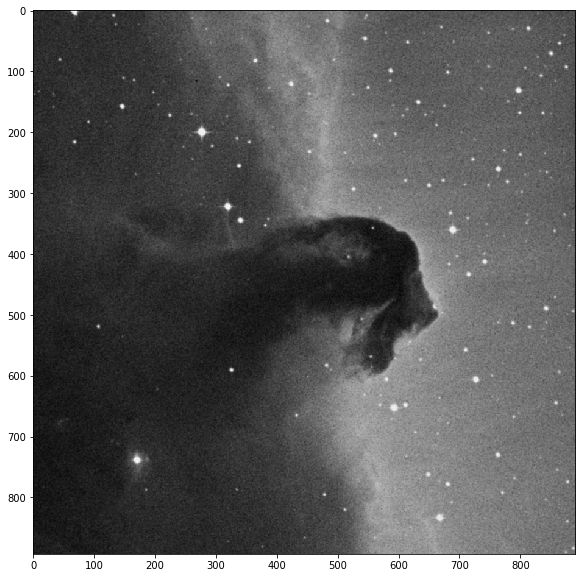

In [23]:
image_data = horse[0].data
print(image_data.shape)
plt.figure(figsize=(20,10))
plt.imshow(image_data, cmap='gray')
plt.show()

*Бонус вопрос: что это за туманность?*

Ну и давайте посмотрим, что у нас там во второй ячейке:

In [38]:
horse[1].header

XTENSION= 'TABLE   '           / ASCII table extension                          
BITPIX  =                    8 / 8 bit bytes                                    
NAXIS   =                    2 / 2-dimensional ASCII table                      
NAXIS1  =                   24 / Width of table in bytes                        
NAXIS2  =                 1600 / Number of rows in table                        
PCOUNT  =                    0 / Size of special data area                      
GCOUNT  =                    1 / one data group (required keyword)              
TFIELDS =                    4 / Number of fields in each row                   
EXTNAME = 'er.mask '           /FITS: Name of Table                             
TTYPE1  = 'XI      '           /                                                
TBCOL1  =                    1 /                                                
TFORM1  = 'F6.2    '           /                                                
TUNIT1  = 'DEGREES '        

Ну это уже не так интересно, давайте идти дальше

# 50 оттенков Matplotlib-a
Matplotlib может вообще все: кроме самых простых графиков которые мы рисовали своими ручками мы можем нарисовать и 3D графики и поверхности и вообще что угодно. Я приведу пару примеров, чтобы у вас было представление о возможностях и о простоте всего этого безобразия:
## 3D Графики

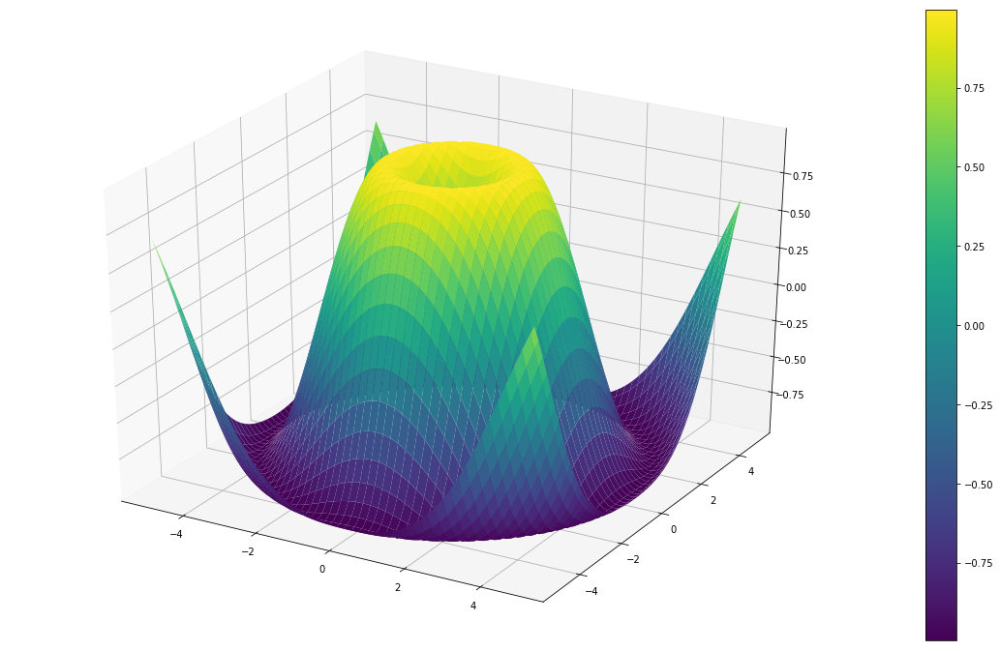

In [69]:

# %matplotlib notebook # если выполните эту штуку можно будет все крутить красиво
%matplotlib inline

fig = plt.figure(figsize=(20,12)) # если у вас включен %matplotlib notebook обязательно уберите figsize
                                  # иначе фигуру кекнет
ax = fig.gca(projection='3d')

X = np.arange(-5, 5, 0.1)
Y = np.arange(-5, 5, 0.1)
X, Y = np.meshgrid(X, Y) # это сделано для того, чтобы получился на выходе двумерный массив
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

surf = ax.plot_surface(X, Y, Z, cmap='viridis')

fig.colorbar(surf)

plt.show()


## 2D графики с цветом

Иногда вам нужно составить что-то типа карты от двух значений. Вот простенький пример:

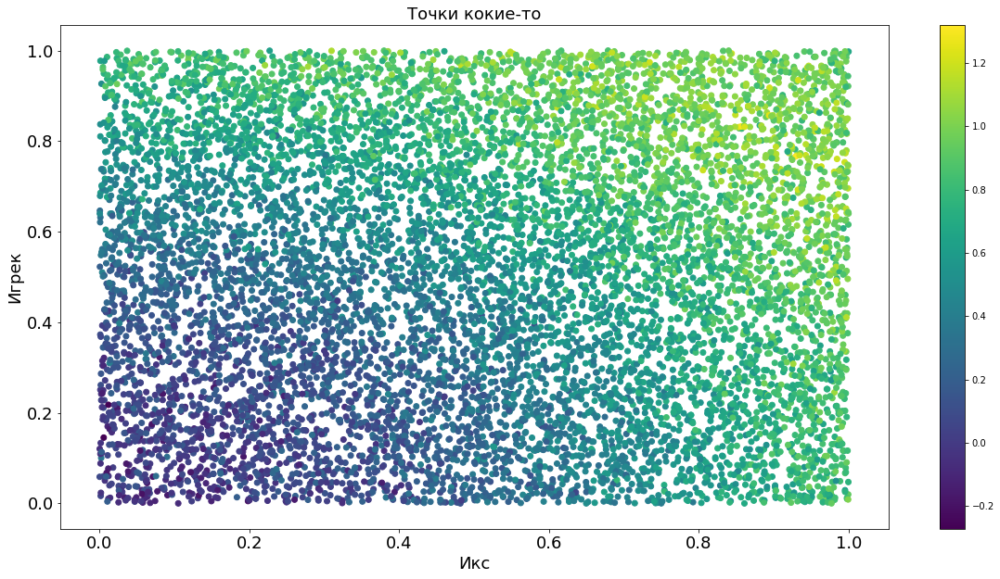

In [14]:
x = np.random.rand(10000,1)
y = np.random.rand(10000,1)

z = np.sin(x**2 + y**2) + 0.1*np.random.randn(len(x), 1) 

plt.figure(figsize=(20,10))
plt.title('Точки кокие-то', fontsize = 18)
plt.xlabel('Икс', fontsize = 18)
plt.ylabel('Игрек', fontsize = 18)
plt.scatter(x, y, c=z) # c=z означает, что z будет задавать цвет точки
plt.colorbar()
ax=plt.gca()
ax.tick_params(labelsize=18)
plt.show()

Давайте теперь добавим шум, но чтобы были выбросы. Смотрите, мы задаем его хитро: берем нормальное распределение, но выкидываем маленькие значения, а оставляем только большие:

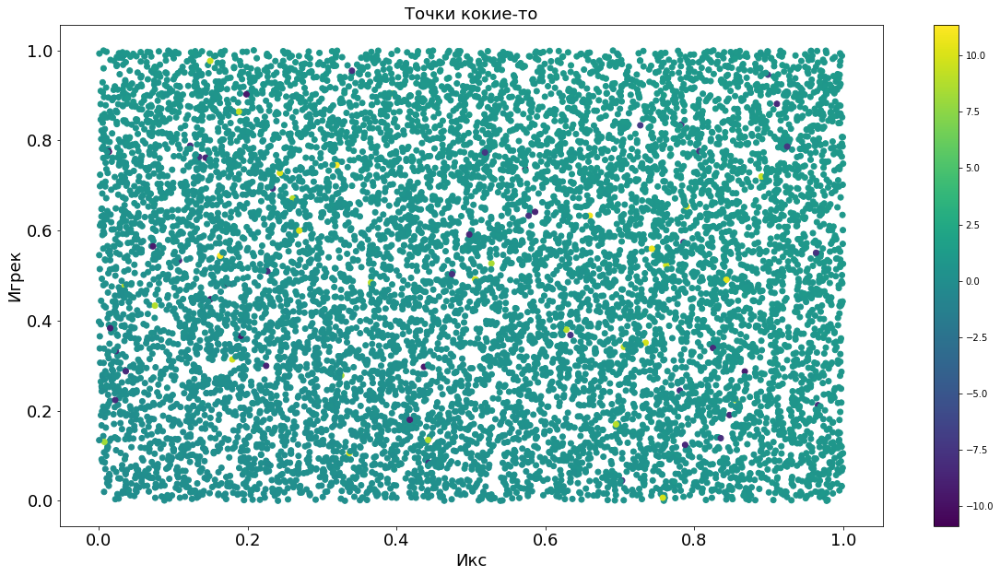

In [15]:
x = np.random.rand(10000,1)
y = np.random.rand(10000,1)

noise = 3*np.random.randn(len(x), 1)
noise[np.abs(noise) < 8] = 0

z = np.sin(x**2 + y**2) + 0.1*np.random.randn(len(x), 1) + noise

plt.figure(figsize=(20,10))
plt.scatter(x, y, c=z)
plt.title('Точки кокие-то', fontsize = 18)
plt.xlabel('Икс', fontsize = 18)
plt.ylabel('Игрек', fontsize = 18)
plt.colorbar()
ax=plt.gca()
ax.tick_params(labelsize=18)
plt.show()

Ooopsie почему наш график стал выглядть однородно? А все потому что выбросы испортили нашу шкалу цвета и визуально кажется, что у нас все совершенно однородно. Надо установить максимальные и минимальные значения:

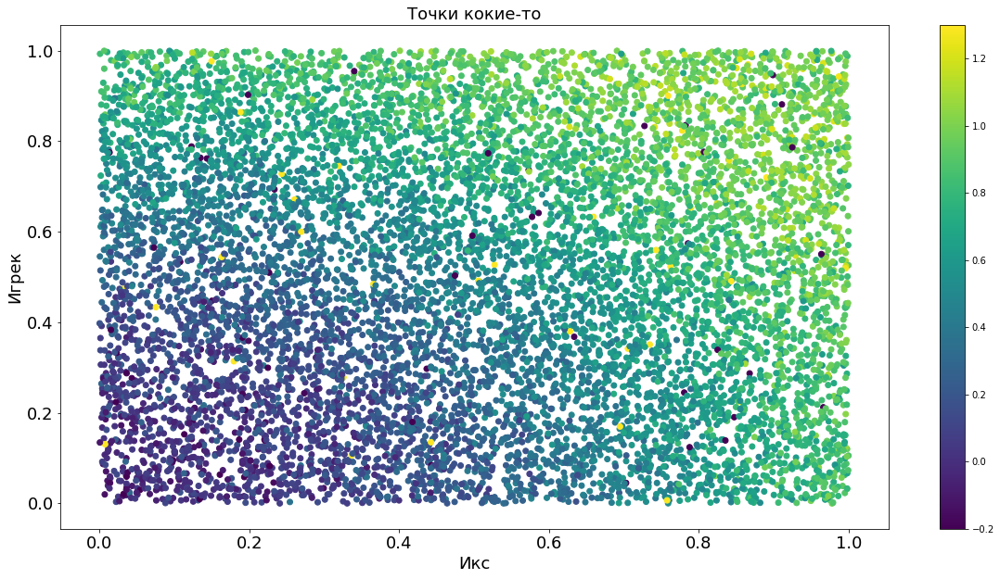

In [16]:
plt.figure(figsize=(20,10))
plt.scatter(x, y, c=z, vmin=-0.2, vmax=1.3)
plt.title('Точки кокие-то', fontsize = 18)
plt.xlabel('Икс', fontsize = 18)
plt.ylabel('Игрек', fontsize = 18)
plt.colorbar()
ax=plt.gca()
ax.tick_params(labelsize=18)
plt.show()

Одна из фич: можно такие выбросы обводить красивенько и выделять чтобы видно было! 

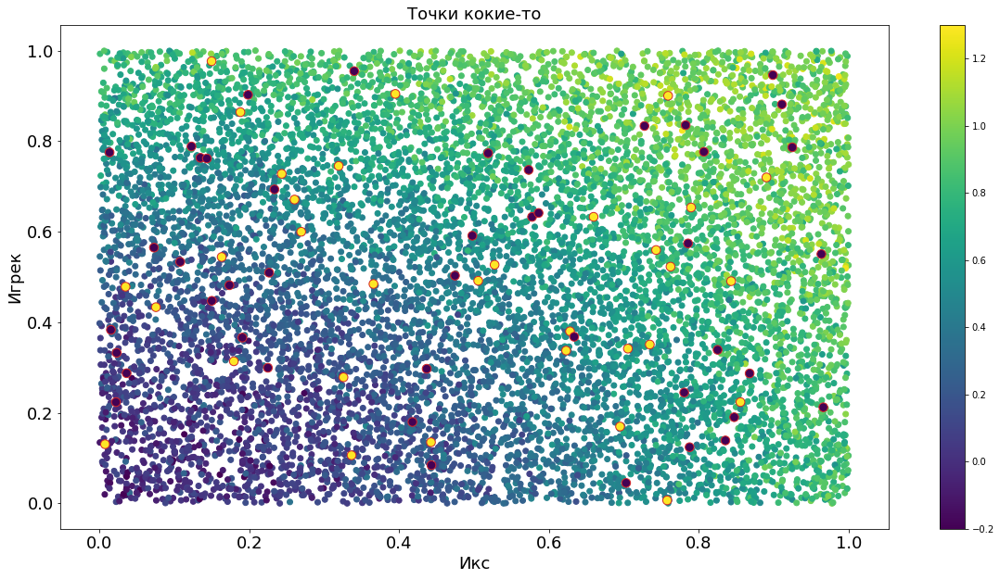

In [38]:
plt.figure(figsize=(20,10))
plt.scatter(x, y, c=z, vmin=-0.2, vmax=1.3)
plt.scatter(x[np.abs(z)>1.3], y[np.abs(z)>1.3], c=z[np.abs(z)>1.3], 
            vmin=-0.2, vmax=1.3, edgecolors='C3', facecolor='none', s=90)
plt.title('Точки кокие-то', fontsize = 18)
plt.xlabel('Икс', fontsize = 18)
plt.ylabel('Игрек', fontsize = 18)
plt.colorbar()
ax=plt.gca()
ax.tick_params(labelsize=18)
plt.show()

## Дополнительно: карты

Чтобы вы окончательно офигели, то на фон можно поставить какую-нибудь png-шку и на ней рисовать. Вот сейчас я просто с url выгрузил карту Марса и нарисовал на нем какие-то точки:

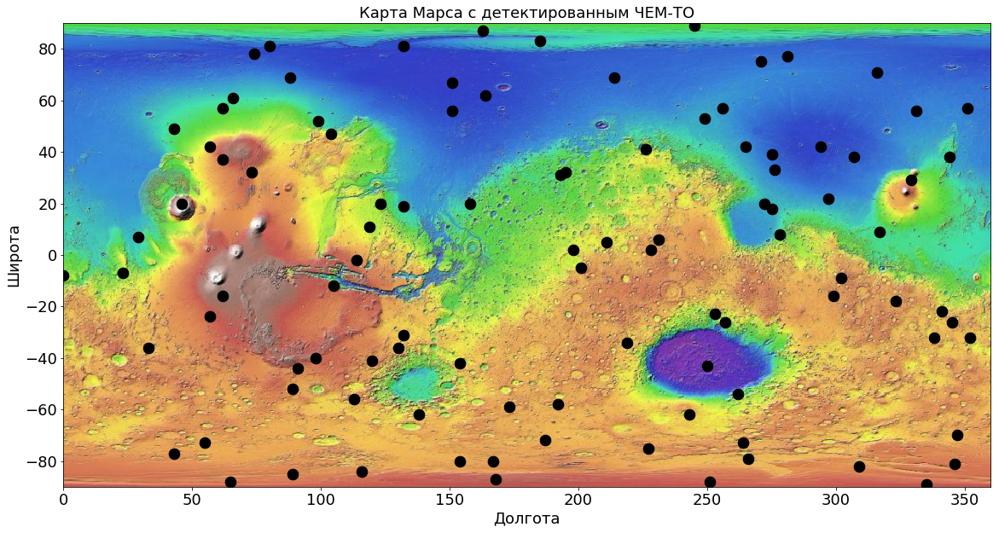

In [38]:
mars = Image.open(urlopen('https://astropedia.astrogeology.usgs.gov/download/Mars/GlobalSurveyor/MOLA/thumbs/Mars_MGS_colorhillshade_mola_1024.jpg'))

y = np.random.randint(-90,90, (100,1))
x = np.random.randint(0,360, (100,1))

plt.figure(figsize = (20,10))
plt.imshow(mars, extent=[0, 360, -90, 90])
plt.scatter(x, y, s=160, color='k')
plt.xlim([0, 360])
plt.ylim([-90, 90])

plt.title('Карта Марса с детектированным ЧЕМ-ТО', fontsize=18)
plt.xlabel('Долгота', fontsize=18)
plt.ylabel('Широта', fontsize=18)

ax=plt.gca()
ax.tick_params(labelsize=18)
plt.show()

# Манипуляции с директориями

Питон имеет достаточно хорошую экосистему, в том числе и работу со строкам. Казалось бы, нам это не особо нужно, но сейчас я покажу один простой кейс:

In [39]:
%ls data/strange -R
# сработает только с unix-подобными системами. на windows ближайщим аналогом будет:
# !dir /s

data/strange:
dir0/  dir1/  dir2/  dir3/  dir4/

data/strange/dir0:
subdir0/  subdir2/  subdir4/  subdir6/  subdir8/
subdir1/  subdir3/  subdir5/  subdir7/  subdir9/

data/strange/dir0/subdir0:
data470.txt  data472.txt  data474.txt  data476.txt  data478.txt
data471.txt  data473.txt  data475.txt  data477.txt  data479.txt

data/strange/dir0/subdir1:
data480.txt  data482.txt  data484.txt  data486.txt  data488.txt
data481.txt  data483.txt  data485.txt  data487.txt  data489.txt

data/strange/dir0/subdir2:
data420.txt  data422.txt  data424.txt  data426.txt  data428.txt
data421.txt  data423.txt  data425.txt  data427.txt  data429.txt

data/strange/dir0/subdir3:
data400.txt  data402.txt  data404.txt  data406.txt  data408.txt
data401.txt  data403.txt  data405.txt  data407.txt  data409.txt

data/strange/dir0/subdir4:
data430.txt  data432.txt  data434.txt  data436.txt  data438.txt
data431.txt  data433.txt  data435.txt  data437.txt  data439.txt

data/strange/dir0/subdir5:
data450.txt  data452.txt  

Как видите, есть куча данных в куче субдиректорий. Предположим нам нужно открыть каждый файл и считать информацию. Вбивать все варианты файлов явно не вариант, это мы так до конца времен не управимся. Что делать? Смотрите что можно сделать:

In [92]:
y = [x[0] for x in os.walk('data/strange/')]
dirs = [i for i in y if i.find('subdir') > 0] # чтобы оставить только директории с файлами внутри
files = []
for name in dirs:
    content = os.listdir(name)
    temp = [name + '/' + i for i in content]
    files.extend(temp)
files

['data/strange/dir1/subdir16/data5.txt',
 'data/strange/dir1/subdir16/data8.txt',
 'data/strange/dir1/subdir16/data2.txt',
 'data/strange/dir1/subdir16/data7.txt',
 'data/strange/dir1/subdir16/data4.txt',
 'data/strange/dir1/subdir16/data3.txt',
 'data/strange/dir1/subdir16/data9.txt',
 'data/strange/dir1/subdir16/data0.txt',
 'data/strange/dir1/subdir16/data6.txt',
 'data/strange/dir1/subdir16/data1.txt',
 'data/strange/dir1/subdir10/data13.txt',
 'data/strange/dir1/subdir10/data15.txt',
 'data/strange/dir1/subdir10/data17.txt',
 'data/strange/dir1/subdir10/data18.txt',
 'data/strange/dir1/subdir10/data16.txt',
 'data/strange/dir1/subdir10/data11.txt',
 'data/strange/dir1/subdir10/data10.txt',
 'data/strange/dir1/subdir10/data19.txt',
 'data/strange/dir1/subdir10/data14.txt',
 'data/strange/dir1/subdir10/data12.txt',
 'data/strange/dir1/subdir11/data25.txt',
 'data/strange/dir1/subdir11/data28.txt',
 'data/strange/dir1/subdir11/data26.txt',
 'data/strange/dir1/subdir11/data29.txt',
 '

Теперь можно открывать их просто в цикле. Или вот такая штука, например нам нужен конкретный файл:

In [93]:
matching = [s for s in files if "a321" in s] # другая вариация поиска по подстроке в списке
matching[0]

'data/strange/dir2/subdir28/data321.txt'

Еще строками можно делать команды unix и много чего, в принципе все что вам придет в голову

# Дополнительно, Case Study: Как превратить питон в фотошоп если вам нечего делать

На самом деле с помощью питона можно делать буквально что угодно. Ну вот вам банальный пример: хотите вы поправить уровни на темноватой фотографии. Обычно, картинка высветляется таким образом: нужно увеличить яркость пикселей хитрым образом. Нам не нужно увеличивать яркость итак ярких пикселей, и не должно быть слишком резких перепадов. Обычно, для визуализации используется [тоновая кривая](https://uk.wikipedia.org/wiki/%D0%A2%D0%BE%D0%BD%D0%B0%D0%BB%D1%8C%D0%BD%D0%B0_%D0%BA%D1%80%D0%B8%D0%B2%D0%B0)

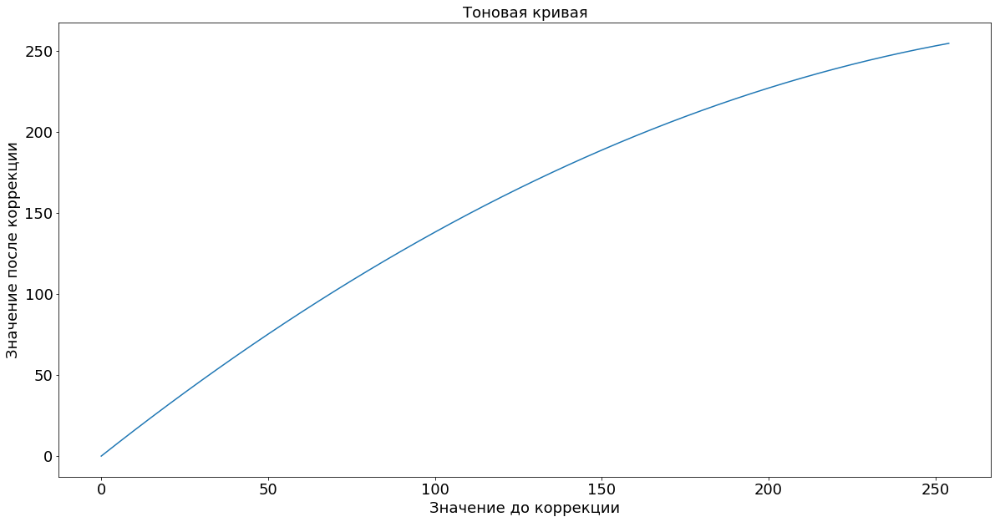

In [168]:
x = np.arange(0,255) # все пиксели имеют яркость от 0 до 255, такак изображение восьмибитное
params = np.polyfit([0, 130, 255],[0, 170, 255], 2) # просто фитируем по трем точкам потому что а почему бы и нет 

plt.figure(figsize=(20, 10))
plt.plot(x, np.polyval(params, x)) # рисуем полином с параметрами params[0]*x^2 + params[1]*x + params[2]
plt.title('Тоновая кривая', fontsize=18)
plt.xlabel('Значение до коррекции', fontsize=18)
plt.ylabel('Значение после коррекции', fontsize=18)


ax=plt.gca()
ax.tick_params(labelsize=18)
plt.show()

Теперь просто применим получившуюсь кривую к изображению:

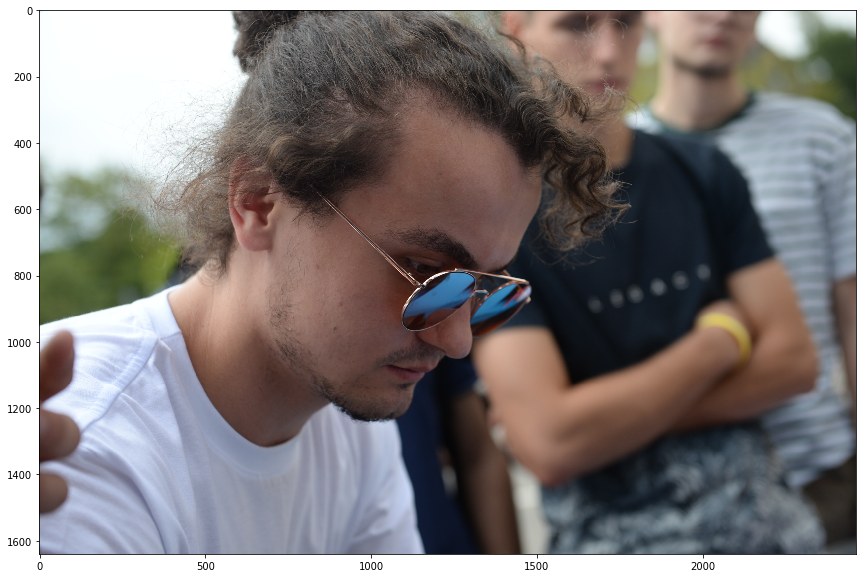

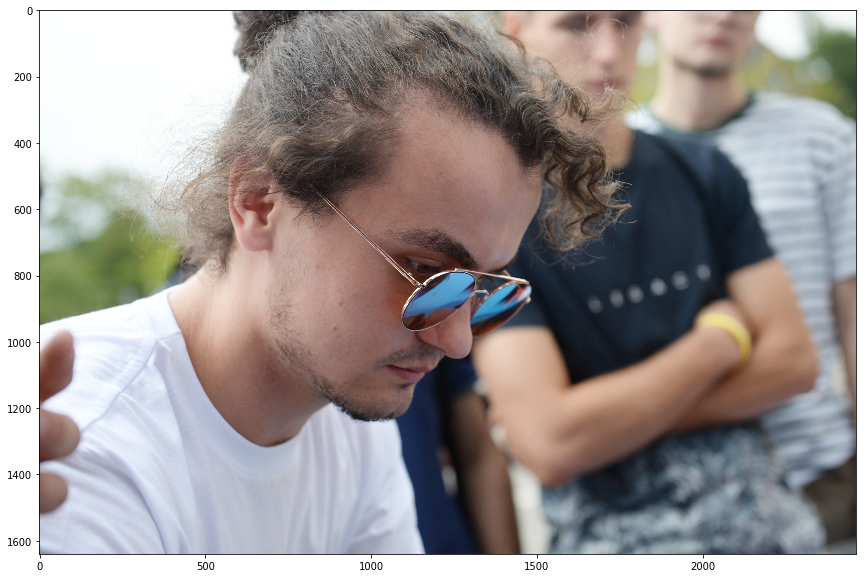

In [158]:
img = Image.open(urlopen('https://pp.userapi.com/c845219/v845219784/e0827/-oltU9S2F5g.jpg')) # фото взято из https://vk.com/albums-932
plt.figure(figsize=(20,10))
plt.imshow(img, vmin = 10)
data = np.array(img)
for i in range (3):
    data[:,:,i] = np.polyval(params, data[:,:,i])
plt.figure(figsize=(20,10))   
plt.imshow(data)
plt.show()

Гораздо лучше! Детали лица гораздо более четко видны! Есть еще один достаточно универсальный рецепт который годится для крайне широкого применений &ndash; логарифмирование. Работает он и для [изображений](https://en.wikipedia.org/wiki/Log_profile):

/home/teimy/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


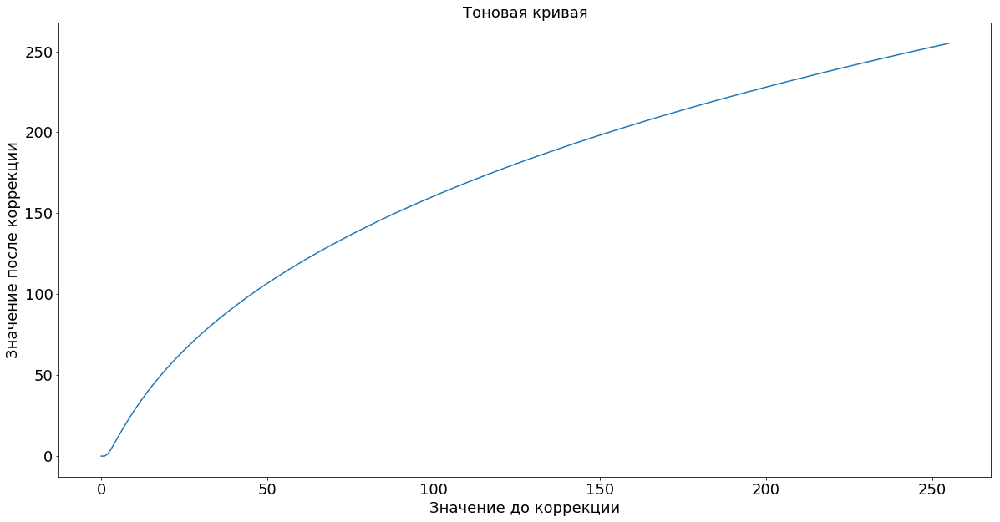

In [178]:
def apply_curve(data):
    #data = np.arange(0,256)
    curve = (np.log(data))**2.5 # степень добавлена для плавности; можете посмотреть что будет без нее
    curve[curve == np.inf] =0
    curve = (255*curve/np.max(curve))
    return curve

plt.figure(figsize=(20, 10))
plt.plot(np.arange(0,256), apply_curve(np.arange(0,256)))
plt.title('Тоновая кривая', fontsize=18)
plt.xlabel('Значение до коррекции', fontsize=18)
plt.ylabel('Значение после коррекции', fontsize=18)


ax=plt.gca()
ax.tick_params(labelsize=18)
plt.show()

Изображение получается намного менее контрастным, но этого мы и добивались на самом деле:

/home/teimy/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


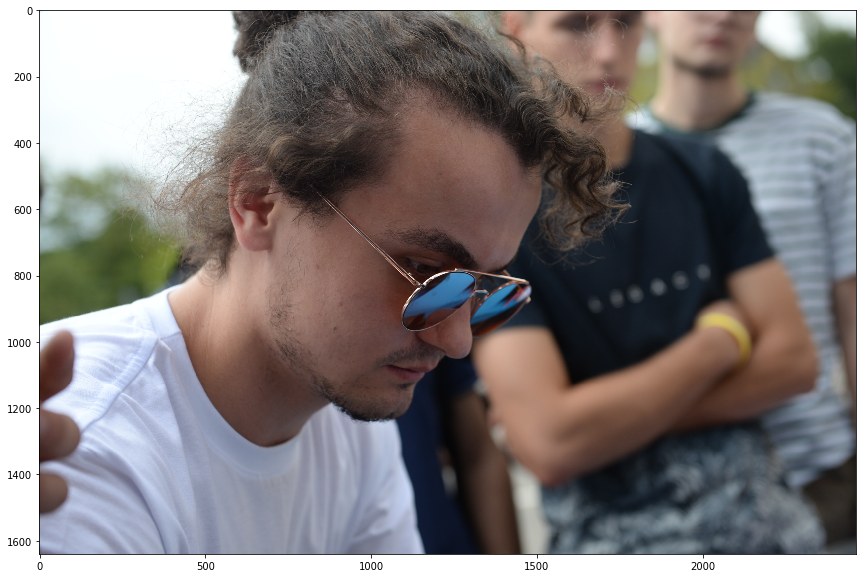

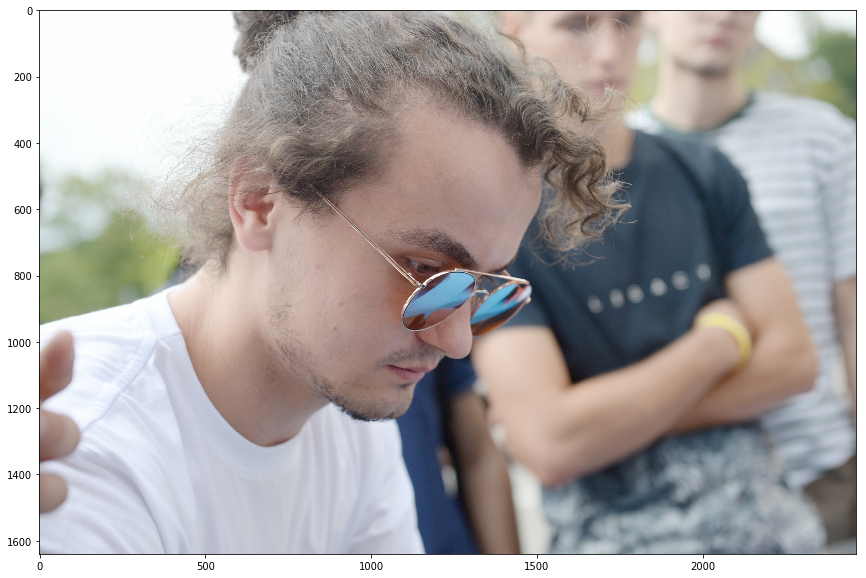

In [179]:
plt.figure(figsize=(20,10))
plt.imshow(img, vmin = 10)
data = np.array(img)
for i in range (3):
    data[:,:,i] = apply_curve(data[:,:,i])
plt.figure(figsize=(20,10))   
plt.imshow(data)
plt.show()

Но это мы сделали своими руками, а для питона существует тысяча и один плагин для всяких таких фич, это просто пример того что вы можете сделать почти что угодно, если вы хотите.

## Дополнительно: таблицы  и их визуализация
Одним из мощных инструментов python является pandas. Pandas это все о таблицах и то, как с ними обращаться!

In [54]:
import pandas as pd
df = pd.read_csv('data/exoplanets.csv')
df

,# name,planet_status,mass,mass_error_min,mass_error_max,mass_sini,mass_sini_error_min,mass_sini_error_max,radius,radius_error_min,...,star_sp_type,star_age,star_age_error_min,star_age_error_max,star_teff,star_teff_error_min,star_teff_error_max,star_detected_disc,star_magnetic_field,star_alternate_names
0,11 Com b,Confirmed,19.40000,1.50000,1.500000,19.40000,1.50000,1.50000,NaN,NaN,...,G8 III,NaN,NaN,NaN,4742.0,100.0,100.0,NaN,NaN,NaN
1,11 Oph b,Confirmed,21.00000,3.00000,3.000000,NaN,NaN,NaN,NaN,NaN,...,M9,0.011,0.002,0.002,2375.0,175.0,175.0,NaN,NaN,"Oph 11A, Oph 1622-2405"
2,11 UMi b,Confirmed,10.50000,2.47000,2.470000,10.50000,2.47000,2.47000,NaN,NaN,...,K4III,1.560,0.540,0.540,4340.0,70.0,70.0,NaN,NaN,NaN
3,14 And b,Confirmed,5.33000,0.57000,0.570000,5.33000,0.57000,0.57000,NaN,NaN,...,K0III,NaN,NaN,NaN,4813.0,20.0,20.0,NaN,NaN,NaN
4,14 Her b,Confirmed,4.64000,0.19000,0.190000,4.64000,0.19000,0.19000,NaN,NaN,...,K0 V,5.100,NaN,NaN,5311.0,87.0,87.0,NaN,NaN,NaN
5,16 Cyg B b,Confirmed,1.68000,0.07000,0.070000,1.68000,0.07000,0.07000,NaN,NaN,...,G2.5 V,8.000,1.800,1.800,5766.0,60.0,60.0,NaN,NaN,NaN
6,18 Del b,Confirmed,10.30000,NaN,NaN,10.30000,NaN,NaN,NaN,NaN,...,G6III,NaN,NaN,NaN,4979.0,18.0,18.0,NaN,NaN,NaN
7,1RXS 1609 b,Confirmed,14.00000,3.00000,2.000000,NaN,NaN,NaN,1.7000,NaN,...,K7V,0.011,0.002,0.002,4060.0,200.0,200.0,NaN,NaN,"1RXS J160929, 1RXS J1609, 1RXS1609"
8,1RXS J235133.3+312720 b,Confirmed,32.00000,6.00000,6.000000,NaN,NaN,NaN,NaN,NaN,...,M2V,0.100,0.050,0.050,NaN,NaN,NaN,NaN,NaN,2MASS J23513366+3127229
9,1SWASP J1407 b,Confirmed,20.00000,6.00000,6.000000,20.00000,6.00000,6.00000,NaN,NaN,...,NaN,0.016,NaN,NaN,4400.0,100.0,100.0,NaN,NaN,NaN


^ Это каталог всех экзопланет. Мы можем фильтровать их как угодно и как нам нравится, [можете поиграться](https://pandas.pydata.org/pandas-docs/stable/getting_started/10min.html)!

Ща покажу пару фич. Сходу можем найти корреляционную матрицу и нарисовать ее:

In [55]:
df.corr()

,mass,mass_error_min,mass_error_max,mass_sini,mass_sini_error_min,mass_sini_error_max,radius,radius_error_min,radius_error_max,orbital_period,...,star_mass_error_max,star_radius,star_radius_error_min,star_radius_error_max,star_age,star_age_error_min,star_age_error_max,star_teff,star_teff_error_min,star_teff_error_max
mass,1.000000,0.643639,0.496867,0.883930,0.543365,0.518315,0.270928,0.215275,0.139220,0.089687,...,0.027816,0.150086,0.117325,0.119910,-0.177143,-0.091448,-0.071981,0.072115,0.012615,0.012199
mass_error_min,0.643639,1.000000,0.815437,0.152733,0.525137,0.493252,0.103422,0.223741,0.120269,0.052257,...,0.046667,0.108682,0.072316,0.064208,-0.122631,-0.076896,-0.063233,-0.019153,0.007201,0.007383
mass_error_max,0.496867,0.815437,1.000000,0.107714,0.419050,0.405685,0.068959,0.158876,0.092826,0.038129,...,0.016134,0.058426,0.032912,0.028669,-0.046680,-0.047222,-0.043166,-0.040503,0.000947,0.001830
mass_sini,0.883930,0.152733,0.107714,1.000000,0.487521,0.468717,0.101495,0.470624,0.585779,0.114708,...,0.111758,0.193861,0.175105,0.182795,-0.109938,-0.118853,-0.087202,0.069358,-0.021624,-0.021566
mass_sini_error_min,0.543365,0.525137,0.419050,0.487521,1.000000,0.962266,0.157853,0.392443,0.531365,0.300587,...,0.174390,0.316202,0.389033,0.367426,-0.099197,-0.086392,-0.090318,-0.062357,-0.017678,-0.017603
mass_sini_error_max,0.518315,0.493252,0.405685,0.468717,0.962266,1.000000,0.138088,0.415190,0.563315,0.322480,...,0.167106,0.288864,0.358655,0.337814,-0.102064,-0.079686,-0.084580,-0.052907,-0.019297,-0.019222
radius,0.270928,0.103422,0.068959,0.101495,0.157853,0.138088,1.000000,0.313033,0.184300,0.074909,...,-0.012626,0.391300,-0.093704,-0.027115,-0.247671,-0.021668,-0.025712,0.159860,-0.071248,-0.065044
radius_error_min,0.215275,0.223741,0.158876,0.470624,0.392443,0.415190,0.313033,1.000000,0.537863,0.017750,...,0.013238,0.138468,0.345107,0.011168,-0.086855,0.002765,0.014959,0.108400,0.163352,0.202358
radius_error_max,0.139220,0.120269,0.092826,0.585779,0.531365,0.563315,0.184300,0.537863,1.000000,0.015157,...,0.016879,0.095666,0.197472,0.730975,-0.041888,0.003976,0.009635,0.093800,0.516809,0.112883
orbital_period,0.089687,0.052257,0.038129,0.114708,0.300587,0.322480,0.074909,0.017750,0.015157,1.000000,...,-0.002867,0.010585,0.001754,-0.001244,-0.085806,-0.033925,-0.035717,-0.042986,0.001081,0.009518


Еще раз, но коротко: корреляция большая по модулю -> есть линейная зависимость; корреляция около нуля -> зависимости нет. Для запоминания показываю мем:

In [57]:
from IPython.display import Image as im
from IPython.core.display import HTML 
im(url= "https://pp.userapi.com/c7006/v7006568/33039/rKGQE33-YLU.jpg")

Так вот, matplotlib может в визуалиацию таких штук, и их иногда удобнее именно рисовать:

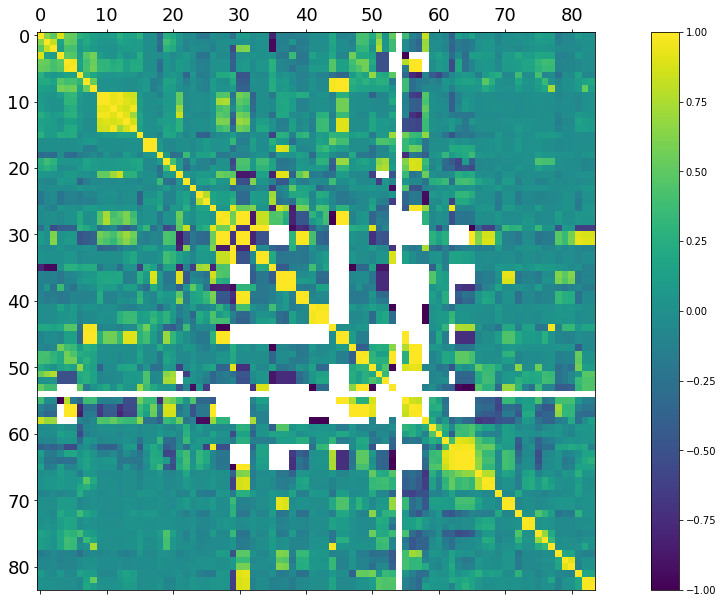

In [67]:
plt.figure(figsize=(20,10))
plt.matshow(df.corr(), fignum=1) # почему-то без fignum не работает
plt.colorbar()
ax=plt.gca()
ax.tick_params(labelsize=18)
plt.show()